Unfortunatley, I was not able to find a significant trend or time-lag with Granger causality. Thus, Let me just try simple Pearson's correlation over the days. In addition, the correlation between case-fatality ratio and accessiblity doesn't show a significant reseult. I will just try accessibility vs. death. 

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, spearmanr
from statsmodels.stats.multitest import fdrcorrection
from statsmodels.tsa.stattools import adfuller, kpss, grangercausalitytests
from tqdm import tqdm
import datetime
import os

# Data

## Define focused dates

In [3]:
from_date = '2020-07-01'
to_date = '2021-12-31'

start_date = datetime.datetime.strptime(from_date,  "%Y-%m-%d")
end_date = datetime.datetime.strptime(to_date,  "%Y-%m-%d")

focus_date = []
delta = datetime.timedelta(days=1)
while start_date <= end_date:
    focus_date.append(start_date.strftime("%m/%d/%Y"))
    start_date += delta

In [4]:
# Make a dictionary that has keys as target date and values as the date that should be averaged. 
focus_date_dict = {}
time_delta = [3, 2, 1, 0, -1, -2, -3]

for idx, date in enumerate(focus_date):
    temp_list = []
    for delta in time_delta:
        temp_list.append(
            str(
                (datetime.datetime.strptime(focus_date[idx], "%m/%d/%Y") - datetime.timedelta(days=delta)
                ).strftime("%m/%d/%Y"))
        )
        
    focus_date_dict[date] = temp_list
    
# Manually enter the dates that would have missing values
focus_date_dict['07/01/2020'] = ['07/01/2020', '07/02/2020', '07/03/2020', '07/04/2020']
focus_date_dict['07/02/2020'] = ['07/01/2020', '07/02/2020', '07/03/2020', '07/04/2020', '07/05/2020']
focus_date_dict['07/03/2020'] = ['07/01/2020', '07/02/2020', '07/03/2020', '07/04/2020', '07/05/2020', '07/06/2020']
focus_date_dict['12/29/2021'] = ['12/26/2021', '12/27/2021', '12/28/2021', '12/29/2021', '12/30/2021', '12/31/2021']
focus_date_dict['12/30/2021'] = ['12/27/2021', '12/28/2021', '12/29/2021', '12/30/2021', '12/31/2021']
focus_date_dict['12/31/2021'] = ['12/28/2021', '12/29/2021', '12/30/2021', '12/31/2021']

In [5]:
access = gpd.read_file("./data/processed_data/ICU_access_measures/ICU_access_county.shp")
# access = access[]
access.head()

,index,NAME,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,...,12/23/2021,12/24/2021,12/25/2021,12/26/2021,12/27/2021,12/28/2021,12/29/2021,12/30/2021,12/31/2021,geometry
0,48327,Menard,0.481450,0.504673,0.494921,0.359804,0.380861,0.416848,0.445366,0.463968,...,0.057078,0.055447,0.057775,0.058969,0.056747,0.050579,0.046795,0.044798,0.042296,"POLYGON ((-99.77120 30.71079, -99.78240 30.710..."
1,48189,Hale,2.661175,2.398550,2.288703,0.672046,0.550668,0.580442,0.673039,0.691939,...,0.007549,0.006805,0.006247,0.005544,0.004431,0.004738,0.004571,0.004513,0.003913,"POLYGON ((-101.73504 33.82864, -101.73507 33.8..."
2,48011,Armstrong,0.008839,0.008874,0.009701,0.009687,0.008540,0.009005,0.009563,0.009912,...,0.001716,0.001967,0.002158,0.002462,0.002360,0.002270,0.002396,0.002478,0.002131,"POLYGON ((-101.08728 35.02708, -101.08729 35.0..."
3,48057,Calhoun,2.364419,1.663282,1.490708,0.618558,0.560262,0.519041,0.482546,0.417936,...,0.138889,0.120955,0.109047,0.109674,0.100102,0.084663,0.076442,0.073078,0.062078,"POLYGON ((-96.35229 28.50953, -96.35241 28.508..."
4,48077,Clay,1.756416,1.993939,1.554681,0.504286,0.399408,0.381449,0.362439,0.333911,...,0.001702,0.002336,0.003988,0.003731,0.004190,0.003748,0.004242,0.005163,0.004003,"POLYGON ((-97.97784 33.81417, -97.97784 33.813..."


In [6]:
death = pd.read_csv('./data/processed_data/relationship/daily_death.csv')
death['index'] = death['index'].astype(str)
death = death.drop(columns=['Unnamed: 0'])
death.head()

,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,...,12/25/2021,12/26/2021,12/27/2021,12/28/2021,12/29/2021,12/30/2021,12/31/2021,TSA,index,NAME
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,G,48001,Anderson
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,J,48003,Andrews
2,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,1,0,0,H,48005,Angelina
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,U,48007,Aransas
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,C,48009,Archer


In [7]:
# Death 7-days moving mean
death_ = death.copy(deep=True)

for col in focus_date: # Just iterate through column (no rows iteration)
    # Simply assigned the mean value to the entire Series
    death_[col] = death[focus_date_dict[col]].mean(axis=1) 

death_ = death_.drop(columns=[f'06/{num:02}/2020' for num in range(1, 31)]) 
death_ 

,07/01/2020,07/02/2020,07/03/2020,07/04/2020,07/05/2020,07/06/2020,07/07/2020,07/08/2020,07/09/2020,07/10/2020,...,12/25/2021,12/26/2021,12/27/2021,12/28/2021,12/29/2021,12/30/2021,12/31/2021,TSA,index,NAME
0,0.25,0.2,0.166667,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,...,0.428571,0.428571,0.285714,0.285714,0.333333,0.2,0.25,G,48001,Anderson
1,0.00,0.2,0.166667,0.142857,0.142857,0.142857,0.142857,0.142857,0.000000,0.000000,...,0.142857,0.142857,0.142857,0.142857,0.166667,0.2,0.25,J,48003,Andrews
2,0.50,0.4,0.666667,0.571429,0.571429,0.428571,0.571429,0.571429,0.571429,0.571429,...,0.142857,0.142857,0.142857,0.142857,0.166667,0.2,0.25,H,48005,Angelina
3,0.00,0.2,0.166667,0.428571,0.571429,0.571429,0.571429,0.571429,0.428571,0.428571,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,U,48007,Aransas
4,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,C,48009,Archer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.428571,0.285714,0.428571,0.285714,0.333333,0.4,0.50,G,48499,Wood
250,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.142857,0.166667,0.2,0.25,B,48501,Yoakum
251,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,C,48503,Young
252,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,T,48505,Zapata


In [10]:
death_.to_csv('./data/plots/ave_mortality_county.csv')

In [59]:
def standardize(ary):
    ary_ = ary.copy()
    ary_ = ary_.astype('float64')
    
    for idx, val in enumerate(ary):
        ary_[idx] = (val - ary.mean()) / ary.std()
        
    return ary_

def normalize(ary):
    ary_ = ary.copy()
    ary_ = ary_.astype('float64')
    
    for idx, val in enumerate(ary):
        ary_[idx] = (val - ary.min()) / (ary.max() - ary.min())
        
    return ary_


def normalize_r(ary):
    ary_ = ary.copy()
    ary_ = ary_.astype('float64')
    
    for idx, val in enumerate(ary):
        ary_[idx] = (ary.min() - val) / (ary.max() - ary.min()) + 1
        
    return ary_

In [10]:
pearson_dict = dict()

for fips in access['index']:

    acc_ts = access.loc[access['index'] == fips, focus_date].values[0]
#     acc_ts = standardize(acc_ts)
    
    death_ts = death.loc[death['index'] == fips, focus_date].values[0]
#     death_ts = standardize(death_ts)
    
    pearr, pearp = pearsonr(acc_ts, death_ts)
    pearson_dict[fips] = dict()
    pearson_dict[fips]["coef"] = pearr
    pearson_dict[fips]["pval"] = pearp
    
pearson_dict

/Users/zawoon96/opt/anaconda3/envs/sa/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/zawoon96/opt/anaconda3/envs/sa/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/zawoon96/opt/anaconda3/envs/sa/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/zawoon96/opt/anaconda3/envs/sa/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/zawoo

{'48327': {'coef': -0.08403371800012988, 'pval': 0.049071816653407596},
 '48189': {'coef': -0.2125505050412934, 'pval': 4.997409247715628e-07},
 '48011': {'coef': -0.051580024420318504, 'pval': 0.22758342073166818},
 '48057': {'coef': -0.0722584697391793, 'pval': 0.09075610203004172},
 '48077': {'coef': -0.1419358483035063, 'pval': 0.0008530491908425044},
 '48361': {'coef': -0.32233846350460277, 'pval': 9.70692602187578e-15},
 '48177': {'coef': -0.25324299054918736, 'pval': 1.7600990212807336e-09},
 '48147': {'coef': -0.31793497866918297, 'pval': 2.322700417882686e-14},
 '48265': {'coef': -0.2803704060316415, 'pval': 2.248023562219981e-11},
 '48391': {'coef': -0.16014847484516614, 'pval': 0.00016443273565957883},
 '48247': {'coef': nan, 'pval': nan},
 '48127': {'coef': -0.1275155113984775, 'pval': 0.00276067311515902},
 '48353': {'coef': -0.16422404622425402, 'pval': 0.00011090906181963123},
 '48041': {'coef': -0.3839674152632451, 'pval': 9.966092921262032e-21},
 '48245': {'coef': -0.4

In [11]:
coefs = [pearson_dict[ind]["coef"] for ind in access["index"]]
pvals = [pearson_dict[ind]["pval"] for ind in access["index"]]
pearson_df = pd.DataFrame({"index": access["index"], "coefs": coefs, "pvals": pvals})
pearson_df.head()

,index,coefs,pvals
0,48327,-0.084034,4.907182e-02
1,48189,-0.212551,4.997409e-07
2,48011,-0.051580,2.275834e-01
3,48057,-0.072258,9.075610e-02
4,48077,-0.141936,8.530492e-04


In [12]:
pearson_gdf = access[['index', 'geometry']].copy(deep=True)
pearson_gdf = pearson_gdf.merge(pearson_df, on="index")
pearson_gdf.head()

,index,geometry,coefs,pvals
0,48327,"POLYGON ((-99.77120 30.71079, -99.78240 30.710...",-0.084034,4.907182e-02
1,48189,"POLYGON ((-101.73504 33.82864, -101.73507 33.8...",-0.212551,4.997409e-07
2,48011,"POLYGON ((-101.08728 35.02708, -101.08729 35.0...",-0.051580,2.275834e-01
3,48057,"POLYGON ((-96.35229 28.50953, -96.35241 28.508...",-0.072258,9.075610e-02
4,48077,"POLYGON ((-97.97784 33.81417, -97.97784 33.813...",-0.141936,8.530492e-04


<AxesSubplot:>

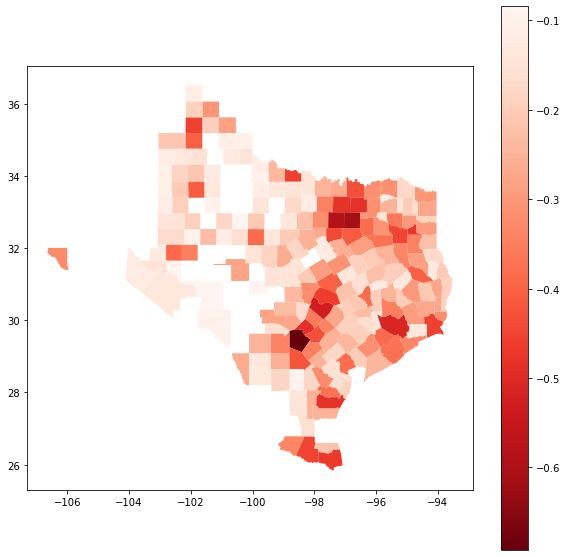

In [13]:
pearson_p05 = pearson_gdf[pearson_gdf["pvals"] <= 0.05]
pearson_p05.plot(column="coefs", figsize=(10, 10), legend=True, cmap='Reds_r')

In [1]:
pearson_p05.explore('coefs')

NameError: name 'pearson_p05' is not defined

# Trend visualization

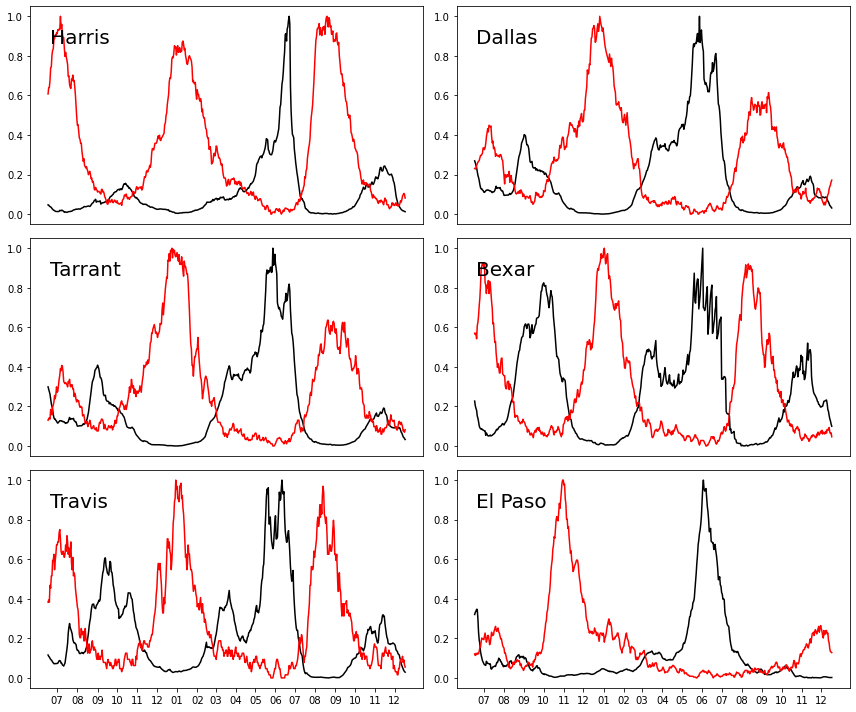

In [96]:
# Below plot; red: Death, black: Access
county_names = {'Harris': '48201', # Houston
                'Dallas': '48113', # Dallas
                'Tarrant': '48439', # Fort Worth
                'Bexar': '48029', # San Antonio
                'Travis': '48453', # Austin
                'El Paso': '48141'
               }

fig, axes = plt.subplots(3, 2, figsize=(12, 10))

for idx, (cName, cCode) in enumerate(county_names.items()):
    ax = axes.reshape(-1)[idx]
    
    acc_ts = access.loc[access['index'] == cCode, focus_date].values[0]
    acc_ts = normalize(acc_ts)
    
    death_ts = death_.loc[death_['index'] == cCode, focus_date].values[0]
    death_ts = normalize(death_ts)
    
    ax.plot(focus_date, acc_ts, label='Access', color='black')
    ax.plot(focus_date, death_ts, label='Death', color='red')
    ax.text(0.05, 0.9, cName, fontsize=20, ha='left', va='top', transform=ax.transAxes)
    
    if idx <= 3:
        ax.get_xaxis().set_visible(False)
        
    else:
        ax.set_xticks([date for date in focus_date if date[3:5] == '15']) # The locations that ticks will be displayed.
        ax.set_xticklabels([date[0:2] for date in focus_date if date[3:5] == '15'])
    
#     ax.axhline(y=0, color='red', ls=':')
#     ax.set_ylim(-2, 5)
    
plt.tight_layout()

# Correlation visualization

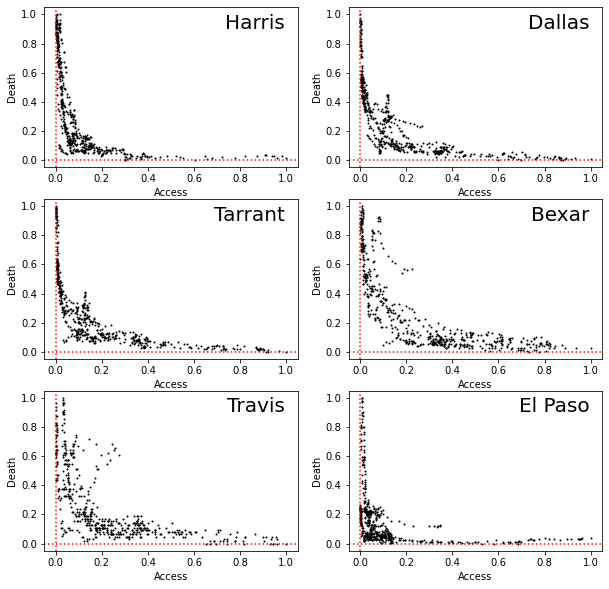

In [19]:
fig, axes = plt.subplots(3, 2, figsize=(10, 10))

axes_ = axes.reshape(-1)

for idx, (cName, cCode) in enumerate(county_names.items()):

    ax = axes.reshape(-1)[idx]
    acc_ts = access.loc[access['index'] == cCode, focus_date].values[0]
    acc_ts = normalize(acc_ts)
    
    death_ts = death_.loc[death_['index'] == cCode, focus_date].values[0]
    death_ts = normalize(death_ts)
    
    
    ax.scatter(acc_ts, death_ts, label='Access', color='black', s=1)
    ax.axhline(y=0, color='red', ls=':')
    ax.axvline(x=0, color='red', ls=':')
    
    ax.set_xlabel('Access') 
    ax.set_ylabel('Death') 
    
    ax.text(0.95, 0.9, cName, fontsize=20, ha='right', va='center', transform=ax.transAxes)

# Testing Granger Causality

In [20]:
from scipy.stats import pearsonr, spearmanr
from statsmodels.stats.multitest import fdrcorrection
from statsmodels.tsa.stattools import adfuller, kpss, grangercausalitytests


def adf_test(timeseries, verbose=False):
    if verbose:
        print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    if verbose:
        print(dfoutput)
    return dfoutput["p-value"]


def kpss_test(timeseries, verbose=False):
    if verbose:
        print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    if verbose:
        print(kpss_output)
    return kpss_output["p-value"]


def get_most_significant_lag(granger_result):
    # this only considers the p-value of the ssr_ftest
    # we might want to look more deeply into which test is best
    best_lag = 0
    min_pval = 1
    for lag in granger_result.keys():
        pval = granger_result[lag][0]["ssr_ftest"][1]
        if pval < min_pval:
            best_lag = lag
            min_pval = pval
    return (best_lag, min_pval)



In [53]:
# import warnings
# # warnings come from KPSS f stastistic lookup.
# warnings.filterwarnings("ignore")

# adf_sig = 0.05
# kpss_sig = 0.05
# max_lag = 30
# granger_results = {}
# for ind in tqdm(access["index"], position=0):
    
#     acc_ts = access.loc[access['index'] == ind, focus_date].copy(deep=True)
#     assert len(acc_ts) == 1
#     acc_ts = acc_ts.T
#     acc_ts.columns = ['access']
     
#     death_ts = death_.loc[death_['index'] == ind, focus_date].copy(deep=True)
#     assert len(death_ts) == 1
#     death_ts = death_ts.T
#     death_ts.columns = ['death']
       
#     x = np.diff(acc_ts["access"])
#     x = np.diff(x)
#     y = np.diff(death_ts["death"])
#     y = np.diff(y)
#     data = pd.DataFrame({"access": x, "death": y})
    
    
#     try:
#         # check for stationarity
#         pval = adf_test(x)
#         if pval >= adf_sig:
#             print(f"{ind} access is non-stationary per adf with pval {pval}")
#             assert False
#         pval = adf_test(y)
#         if pval >= adf_sig:
#             print(f"{ind} death is non-stationary per adf with pval {pval}")
#             assert False
#         pval = kpss_test(x)
#         if pval <= kpss_sig:
#             print(f"{ind} access is non-stationary per kpss with pval {pval}")
#             assert False
#         pval = kpss_test(y)
#         if pval <= kpss_sig:
#             print(f"{ind} death is non-stationary per kpss with pval {pval}")
#             assert False
        
#         result = grangercausalitytests(data, maxlag=max_lag, verbose=False)
#         lag, pval = get_most_significant_lag(result)
#         granger_results[ind] = dict()
#         granger_results[ind]["lag"] = lag
#         granger_results[ind]["pval"] = pval
#     except:
#         print(f"{ind} failed")
#         granger_results[ind] = dict()
#         granger_results[ind]["lag"] = np.nan
#         granger_results[ind]["pval"] = np.nan

  0%|                                                   | 0/254 [00:00<?, ?it/s]

48327 death is non-stationary per kpss with pval 0.041666666666673
48327 failed


  4%|█▋                                        | 10/254 [00:02<01:04,  3.77it/s]

48247 failed
48127 death is non-stationary per kpss with pval 0.04166666666666349
48127 failed


  7%|██▉                                       | 18/254 [00:04<01:02,  3.78it/s]

48413 death is non-stationary per kpss with pval 0.041666666666661044
48413 failed


 12%|█████▏                                    | 31/254 [00:08<01:07,  3.31it/s]

48311 death is non-stationary per kpss with pval 0.04166666666667026
48311 failed


 14%|█████▊                                    | 35/254 [00:09<01:00,  3.61it/s]

48271 death is non-stationary per kpss with pval 0.04166666666669234
48271 failed


 15%|██████                                    | 37/254 [00:09<00:51,  4.17it/s]

48045 failed


 17%|███████▎                                  | 44/254 [00:11<01:00,  3.46it/s]

48305 death is non-stationary per kpss with pval 0.04166666666665854
48305 failed


 18%|███████▌                                  | 46/254 [00:11<00:51,  4.04it/s]

48359 death is non-stationary per kpss with pval 0.04166666666665601
48359 failed


 24%|█████████▉                                | 60/254 [00:15<00:36,  5.35it/s]

48237 death is non-stationary per kpss with pval 0.04166666666667382
48237 failed
48211 failed
48417 death is non-stationary per kpss with pval 0.04166666666668531
48417 failed


 28%|███████████▌                              | 70/254 [00:18<00:43,  4.23it/s]

48137 failed


 34%|██████████████▍                           | 87/254 [00:22<00:32,  5.19it/s]

48385 failed


 35%|██████████████▉                           | 90/254 [00:23<00:39,  4.16it/s]

48345 failed


 38%|███████████████▊                          | 96/254 [00:24<00:32,  4.85it/s]

48377 failed
48489 access is non-stationary per kpss with pval 0.041666666666676275
48489 failed


 45%|██████████████████▌                      | 115/254 [00:29<00:26,  5.22it/s]

48295 death is non-stationary per kpss with pval 0.041666666666662466
48295 failed
48087 death is non-stationary per kpss with pval 0.041666666666665894
48087 failed


 46%|██████████████████▉                      | 117/254 [00:30<00:33,  4.06it/s]

48173 failed


 48%|███████████████████▋                     | 122/254 [00:31<00:37,  3.53it/s]

48229 failed


 50%|████████████████████▋                    | 128/254 [00:33<00:38,  3.25it/s]

48467 access is non-stationary per kpss with pval 0.04166666666665647
48467 failed


 52%|█████████████████████▎                   | 132/254 [00:34<00:34,  3.58it/s]

48235 failed


 53%|█████████████████████▋                   | 134/254 [00:34<00:28,  4.19it/s]

48047 death is non-stationary per kpss with pval 0.04166666666672992
48047 failed


 55%|██████████████████████▌                  | 140/254 [00:36<00:34,  3.30it/s]

48243 failed


 57%|███████████████████████▍                 | 145/254 [00:37<00:34,  3.17it/s]

48095 death is non-stationary per kpss with pval 0.04166666666666741
48095 failed


 64%|██████████████████████████▏              | 162/254 [00:42<00:27,  3.36it/s]

48161 death is non-stationary per kpss with pval 0.04166666666667717
48161 failed


 65%|██████████████████████████▍              | 164/254 [00:43<00:20,  4.37it/s]

48443 failed


 67%|███████████████████████████▌             | 171/254 [00:44<00:18,  4.39it/s]

48199 death is non-stationary per kpss with pval 0.04166666666664634
48199 failed


 69%|████████████████████████████             | 174/254 [00:45<00:17,  4.55it/s]

48447 failed


 78%|███████████████████████████████▊         | 197/254 [00:51<00:16,  3.54it/s]

48263 failed


 78%|████████████████████████████████         | 199/254 [00:51<00:13,  4.11it/s]

48301 failed
48125 failed


 82%|█████████████████████████████████▋       | 209/254 [00:54<00:10,  4.15it/s]

48269 failed


 84%|██████████████████████████████████▍      | 213/254 [00:54<00:09,  4.48it/s]

48261 failed


 90%|████████████████████████████████████▉    | 229/254 [00:58<00:07,  3.45it/s]

48393 failed


 91%|█████████████████████████████████████▎   | 231/254 [00:59<00:05,  3.85it/s]

48379 death is non-stationary per kpss with pval 0.04166666666661681
48379 failed


 93%|█████████████████████████████████████▉   | 235/254 [01:00<00:04,  3.94it/s]

48483 death is non-stationary per kpss with pval 0.04166666666665309
48483 failed


 97%|███████████████████████████████████████▊ | 247/254 [01:02<00:01,  4.56it/s]

48319 failed


 98%|████████████████████████████████████████▏| 249/254 [01:03<00:01,  4.98it/s]

48205 failed


100%|█████████████████████████████████████████| 254/254 [01:04<00:00,  3.94it/s]


In [90]:
focus_date[0:110]

['07/01/2020',
 '07/02/2020',
 '07/03/2020',
 '07/04/2020',
 '07/05/2020',
 '07/06/2020',
 '07/07/2020',
 '07/08/2020',
 '07/09/2020',
 '07/10/2020',
 '07/11/2020',
 '07/12/2020',
 '07/13/2020',
 '07/14/2020',
 '07/15/2020',
 '07/16/2020',
 '07/17/2020',
 '07/18/2020',
 '07/19/2020',
 '07/20/2020',
 '07/21/2020',
 '07/22/2020',
 '07/23/2020',
 '07/24/2020',
 '07/25/2020',
 '07/26/2020',
 '07/27/2020',
 '07/28/2020',
 '07/29/2020',
 '07/30/2020',
 '07/31/2020',
 '08/01/2020',
 '08/02/2020',
 '08/03/2020',
 '08/04/2020',
 '08/05/2020',
 '08/06/2020',
 '08/07/2020',
 '08/08/2020',
 '08/09/2020',
 '08/10/2020',
 '08/11/2020',
 '08/12/2020',
 '08/13/2020',
 '08/14/2020',
 '08/15/2020',
 '08/16/2020',
 '08/17/2020',
 '08/18/2020',
 '08/19/2020',
 '08/20/2020',
 '08/21/2020',
 '08/22/2020',
 '08/23/2020',
 '08/24/2020',
 '08/25/2020',
 '08/26/2020',
 '08/27/2020',
 '08/28/2020',
 '08/29/2020',
 '08/30/2020',
 '08/31/2020',
 '09/01/2020',
 '09/02/2020',
 '09/03/2020',
 '09/04/2020',
 '09/05/20

In [91]:
import warnings
# warnings come from KPSS f stastistic lookup.
warnings.filterwarnings("ignore")

adf_sig = 0.05
kpss_sig = 0.05
max_lag = 30
granger_results = {}
for ind in tqdm(access["index"], position=0):
    
    acc_ts = access.loc[access['index'] == ind, focus_date[0:110]].copy(deep=True)
#     acc_ts = normalize_r(acc_ts.values[0])
    assert len(acc_ts) == 1
    acc_ts = acc_ts.T
    acc_ts.columns = ['access']
#     acc_ts = pd.DataFrame(acc_ts, columns=['access'])
     
    death_ts = death_.loc[death_['index'] == ind, focus_date[0:110]].copy(deep=True)
#     death_ts = normalize(death_ts.values[0])
    assert len(death_ts) == 1
    death_ts = death_ts.T
    death_ts.columns = ['death']
#     death_ts = pd.DataFrame(death_ts, columns=['death'])

       
    x = np.diff(acc_ts["access"])
    x = np.diff(x)
    y = np.diff(death_ts["death"])
    y = np.diff(y)
    data = pd.DataFrame({"access": x, "death": y})
    
    
    try:
        # check for stationarity
        pval = adf_test(x)
        if pval >= adf_sig:
            print(f"{ind} access is non-stationary per adf with pval {pval}")
            assert False
        pval = adf_test(y)
        if pval >= adf_sig:
            print(f"{ind} death is non-stationary per adf with pval {pval}")
            assert False
#         pval = kpss_test(x)
#         if pval <= kpss_sig:
#             print(f"{ind} access is non-stationary per kpss with pval {pval}")
#             assert False
#         pval = kpss_test(y)
#         if pval <= kpss_sig:
#             print(f"{ind} death is non-stationary per kpss with pval {pval}")
#             assert False
        
        result = grangercausalitytests(data, maxlag=max_lag, verbose=False)
        lag, pval = get_most_significant_lag(result)
        granger_results[ind] = dict()
        granger_results[ind]["lag"] = lag
        granger_results[ind]["pval"] = pval
    except:
        print(f"{ind} failed")
        granger_results[ind] = dict()
        granger_results[ind]["lag"] = np.nan
        granger_results[ind]["pval"] = np.nan

  1%|▎                                          | 2/254 [00:00<00:21, 11.54it/s]

48327 failed


  5%|█▉                                        | 12/254 [00:01<00:28,  8.53it/s]

48247 failed


  7%|██▊                                       | 17/254 [00:01<00:24,  9.60it/s]

48027 access is non-stationary per adf with pval 0.22553463221005304
48027 failed


  9%|███▊                                      | 23/254 [00:02<00:27,  8.29it/s]

48119 failed


 15%|██████▍                                   | 39/254 [00:04<00:23,  8.99it/s]

48045 failed


 17%|███████▎                                  | 44/254 [00:05<00:19, 10.54it/s]

48103 failed


 19%|███████▉                                  | 48/254 [00:05<00:18, 11.29it/s]

48333 failed
48359 failed


 24%|██████████▎                               | 62/254 [00:07<00:17, 11.12it/s]

48211 failed
48417 failed


 28%|███████████▉                              | 72/254 [00:08<00:19,  9.54it/s]

48137 failed


 35%|██████████████▌                           | 88/254 [00:10<00:14, 11.59it/s]

48155 failed
48385 failed
48065 failed


 36%|███████████████▏                          | 92/254 [00:10<00:15, 10.22it/s]

48345 failed


 39%|████████████████▏                         | 98/254 [00:11<00:16,  9.30it/s]

48377 failed


 44%|██████████████████                       | 112/254 [00:13<00:17,  8.05it/s]

48431 failed


 46%|██████████████████▋                      | 116/254 [00:13<00:15,  8.98it/s]

48087 failed


 47%|███████████████████▏                     | 119/254 [00:14<00:13,  9.73it/s]

48173 failed


 49%|████████████████████                     | 124/254 [00:14<00:14,  9.08it/s]

48229 failed


 52%|█████████████████████▎                   | 132/254 [00:15<00:15,  7.94it/s]

48253 failed
48235 failed


 56%|██████████████████████▉                  | 142/254 [00:17<00:11,  9.91it/s]

48075 failed
48243 failed


 61%|████████████████████████▊                | 154/254 [00:18<00:11,  8.41it/s]

48191 failed


 65%|██████████████████████████▊              | 166/254 [00:20<00:10,  8.02it/s]

48443 failed


 72%|█████████████████████████████▍           | 182/254 [00:22<00:09,  7.61it/s]

48387 death is non-stationary per adf with pval 0.21344299730724153
48387 failed


 72%|█████████████████████████████▋           | 184/254 [00:23<00:09,  7.60it/s]

48197 failed


 78%|████████████████████████████████         | 199/254 [00:25<00:06,  8.22it/s]

48263 failed
48301 failed
48125 failed


 83%|██████████████████████████████████       | 211/254 [00:26<00:04,  8.78it/s]

48269 failed


 85%|██████████████████████████████████▊      | 216/254 [00:27<00:03, 11.99it/s]

48261 failed
48033 failed
48411 failed


 88%|████████████████████████████████████▏    | 224/254 [00:28<00:03,  8.03it/s]

48475 failed


 91%|█████████████████████████████████████▎   | 231/254 [00:29<00:02,  8.61it/s]

48393 failed


 93%|██████████████████████████████████████▎  | 237/254 [00:30<00:02,  8.35it/s]

48483 failed


 99%|████████████████████████████████████████▌| 251/254 [00:32<00:00,  8.30it/s]

48205 failed


100%|█████████████████████████████████████████| 254/254 [00:32<00:00,  7.83it/s]


In [92]:
lags = [granger_results[ind]["lag"] for ind in access["index"]]
pvals = [granger_results[ind]["pval"] for ind in access["index"]]
result_df = pd.DataFrame({"index": access["index"], "lag": lags, "pvals": pvals})
result_df.dropna(subset=["lag", "pvals"], inplace=True)
result_df

,index,lag,pvals
1,48189,29.0,0.452883
2,48011,27.0,0.000272
3,48057,9.0,0.198738
4,48077,17.0,0.008743
5,48361,1.0,0.115333
...,...,...,...
248,48441,3.0,0.010622
250,48249,21.0,0.222317
251,48505,6.0,0.677049
252,48453,23.0,0.159415


In [93]:
result_df['pvals'].min()

6.852665425214838e-09

In [94]:
result_gdf = access[['index', 'NAME', 'geometry']].copy(deep=True)
result_gdf = result_gdf.merge(result_df, on="index")
result_gdf

,index,NAME,geometry,lag,pvals
0,48189,Hale,"POLYGON ((-101.73504 33.82864, -101.73507 33.8...",29.0,0.452883
1,48011,Armstrong,"POLYGON ((-101.08728 35.02708, -101.08729 35.0...",27.0,0.000272
2,48057,Calhoun,"POLYGON ((-96.35229 28.50953, -96.35241 28.508...",9.0,0.198738
3,48077,Clay,"POLYGON ((-97.97784 33.81417, -97.97784 33.813...",17.0,0.008743
4,48361,Orange,"POLYGON ((-93.75508 30.01531, -93.75524 30.015...",1.0,0.115333
...,...,...,...,...,...
210,48441,Taylor,"POLYGON ((-99.63057 32.31390, -99.63057 32.313...",3.0,0.010622
211,48249,Jim Wells,"POLYGON ((-97.93395 27.85971, -97.93395 27.859...",21.0,0.222317
212,48505,Zapata,"POLYGON ((-99.15217 27.27142, -99.15088 27.271...",6.0,0.677049
213,48453,Travis,"POLYGON ((-97.76561 30.43241, -97.76532 30.432...",23.0,0.159415


In [95]:
result_gdf.loc[result_gdf['pvals'] < 0.10].explore('lag')

In [82]:
result_gdf.loc[result_gdf['pvals'] < 0.10].explore('lag')

<AxesSubplot:>

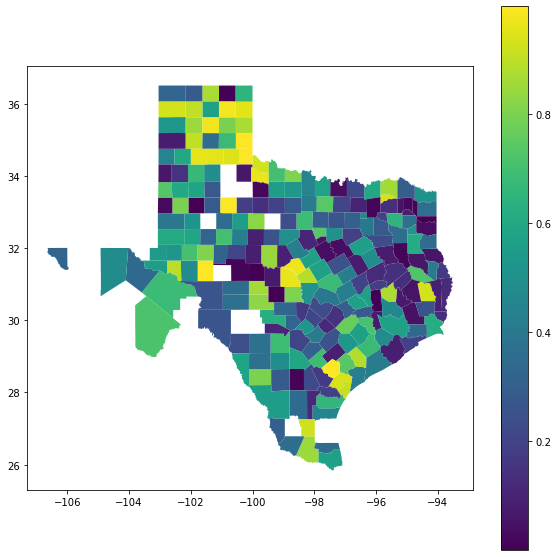

In [81]:
result_gdf.plot('pvals', legend=True, figsize=(10,10))